In [ ]:
import kagglehub
sshikamaru_car_object_detection_path = kagglehub.dataset_download('sshikamaru/car-object-detection')

print('Data source import complete.')

Data source import complete.


In [ ]:
import numpy as np 
import pandas as pd 

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/car-object-detection/data/sample_submission.csv
/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv
/kaggle/input/car-object-detection/data/testing_images/vid_5_26420.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_31520.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29420.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_31720.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_26560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_27840.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_28560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_28360.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_25240.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29020.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_30720.jpg
/kaggle/

In [3]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 14.6 MB/s eta 0:00:00a 0:00:01


In [4]:
from ultralytics import YOLO
import os
import random
import shutil
import numpy as np
import pandas as pd
import cv2
import yaml
import matplotlib.pyplot as plt
import glob
from sklearn.model_selection import train_test_split

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
DIR = "/kaggle/working/datasets/cars/"
IMAGES = DIR +"images/"
LABELS = DIR +"labels/"

TRAIN = "/kaggle/input/car-object-detection/data/training_images"
TEST = "/kaggle/input/car-object-detection/data/testing_images"

In [6]:
df = pd.read_csv("/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv")
df

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422
...,...,...,...,...,...
554,vid_4_9860.jpg,0.000000,198.321729,49.235251,236.223284
555,vid_4_9880.jpg,329.876184,156.482351,536.664239,250.497895
556,vid_4_9900.jpg,0.000000,168.295823,141.797524,239.176652
557,vid_4_9960.jpg,487.428988,172.233646,616.917699,228.839864


In [7]:
files = list(df.image.unique())
files_train, files_valid = train_test_split(files, test_size = 0.2)

In [8]:
os.makedirs(IMAGES+"train", exist_ok=True)
os.makedirs(LABELS+"train", exist_ok=True)
os.makedirs(IMAGES+"valid", exist_ok=True)
os.makedirs(LABELS+"valid", exist_ok=True)

In [9]:
train_filename = set(files_train)
valid_filename = set(files_valid)
for file in glob.glob(TRAIN+'/*'):
    fname =os.path.basename(file)
    if fname in train_filename:
        shutil.copy(file,IMAGES+'train')
    elif fname in valid_filename:
        shutil.copy(file,IMAGES+'valid')

In [10]:
for _, row in df.iterrows():
    image_file = row['image']
    class_id = "0"
    x = row['xmin']
    y = row['ymin']
    width = row['xmax'] - row['xmin']
    height = row['ymax'] - row['ymin']
    x_center = x + (width / 2)
    y_center = y + (height / 2)
    x_center /= 676
    y_center /= 380
    width /= 676
    height /= 380

    if image_file in train_filename:
        annotation_file = os.path.join(LABELS) + "train/" + image_file.replace('.jpg', '.txt')
    else:
        annotation_file = os.path.join(LABELS) + "valid/" + image_file.replace('.jpg', '.txt')

    with open(annotation_file, 'a') as ann_file:
        ann_file.write(f"{class_id} {x_center} {y_center} {width} {height}\n")

In [11]:
%%writefile dataset.yaml
# Path
path: ./cars
train: images/train
val: images/valid

# Classes
nc: 1
names: ['car']

Writing dataset.yaml


In [ ]:
model = YOLO('yolov8m.pt')
model.train(data="dataset.yaml", epochs=90, batch=16)

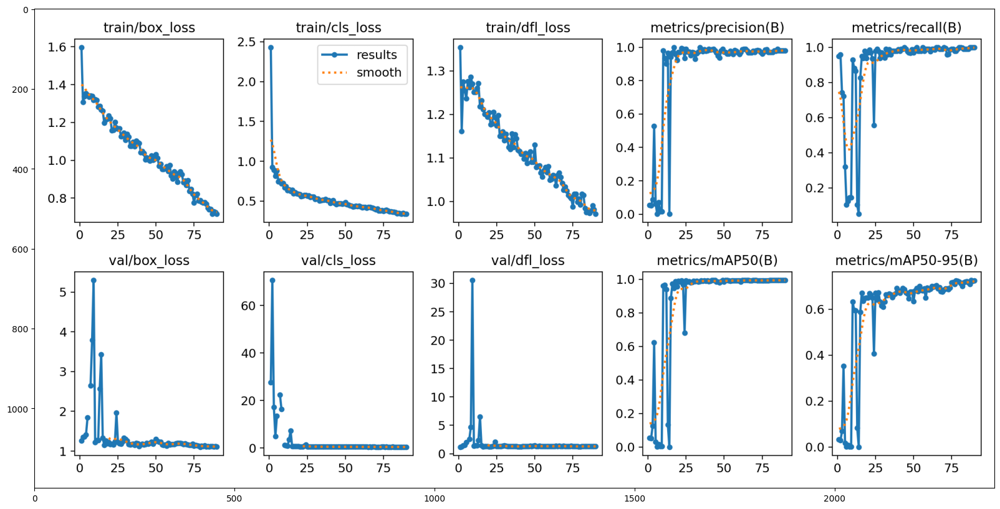

In [ ]:
plt.figure(figsize=(20, 10))
plt.imshow(plt.imread('/kaggle/working/runs/detect/train/results.png'))

In [14]:
metrics=model.val()

Ultralytics 8.3.28 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/datasets/cars/labels/valid.cache... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.32it/s]


                   all         71         97       0.98      0.999      0.995      0.727
Speed: 0.2ms preprocess, 12.9ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs/detect/train2


In [ ]:
print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")
print(f"Mean Average Precision @ .50   : {metrics.box.map50}")
print(f"Mean Average Precision @ .70   : {metrics.box.map75}")

Mean Average Precision @.5:.95 : 0.7267371257760817
Mean Average Precision @ .50   : 0.9945959595959596
Mean Average Precision @ .70   : 0.9148927896209259


In [16]:
model = YOLO('./runs/detect/train/weights/last.pt')
ret = model("/kaggle/input/car-object-detection/data/testing_images",save=True, conf=0.2, iou=0.5)


image 1/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25100.jpg: 384x640 (no detections), 47.7ms
image 2/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25120.jpg: 384x640 (no detections), 25.1ms
image 3/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25140.jpg: 384x640 (no detections), 25.1ms
image 4/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25160.jpg: 384x640 (no detections), 25.0ms
image 5/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25180.jpg: 384x640 (no detections), 24.4ms
image 6/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25200.jpg: 384x640 (no detections), 22.1ms
image 7/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25220.jpg: 384x640 (no detections), 22.1ms
image 8/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25240.jpg: 384x640 (no detections), 22.1ms
image 9/175 /kaggle/input/car-object-detection/data/testing_images/vid_

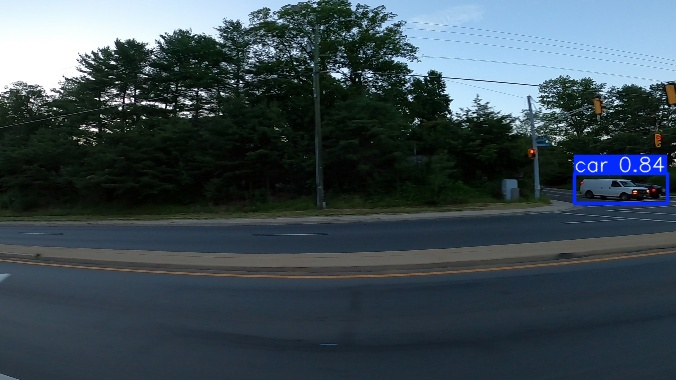

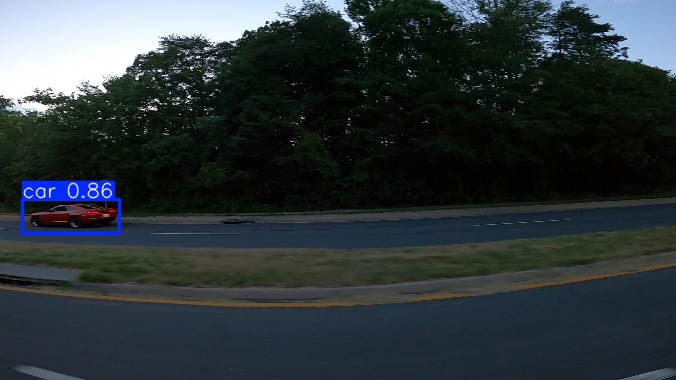

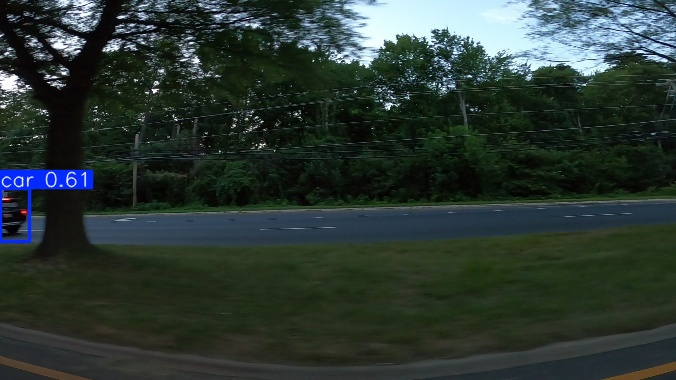

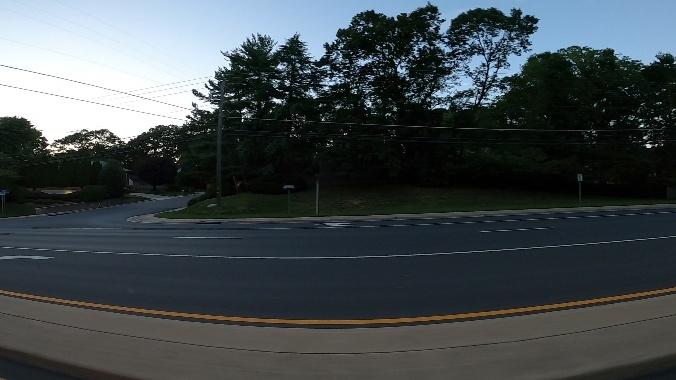

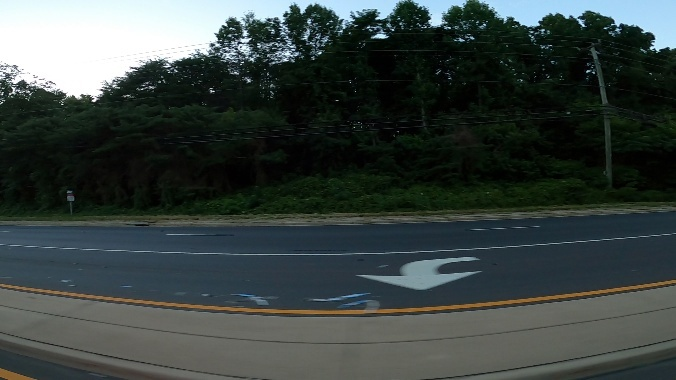

...

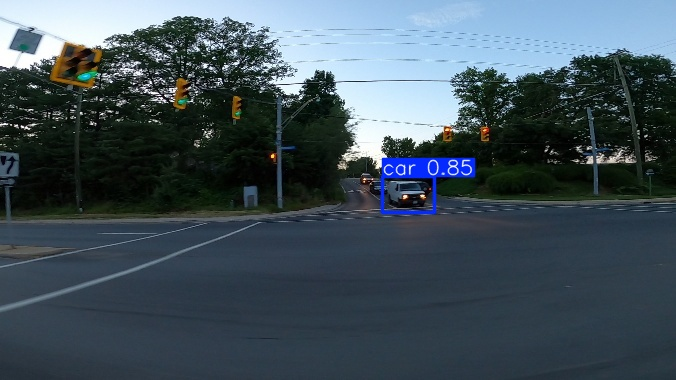

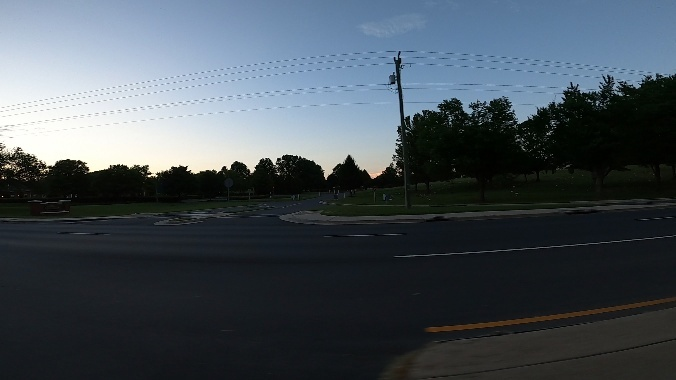

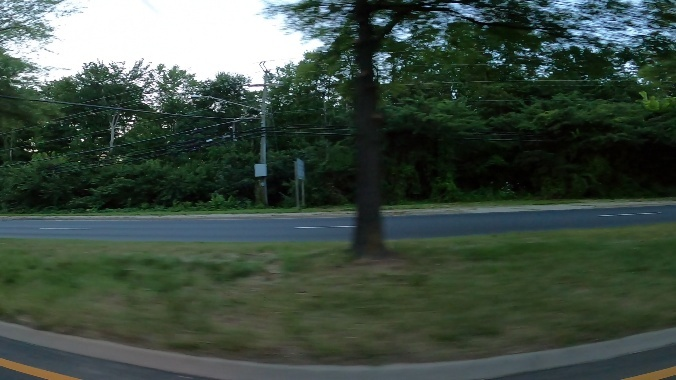

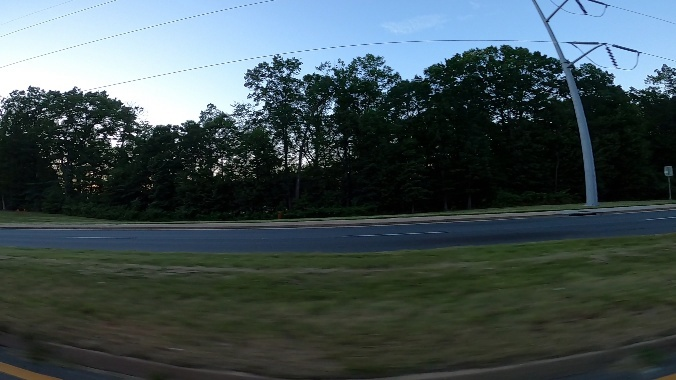

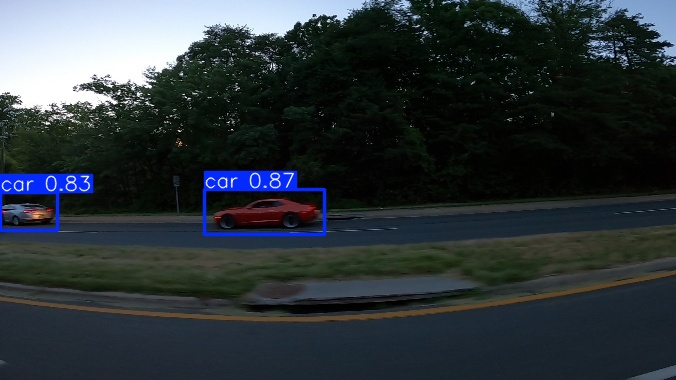

In [17]:
from IPython.display import Image

files = glob.glob("./runs/detect/predict/*")
for i in range(0, 40, 3):
    img = Image(files[i])
    display(img)


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21600.jpg: 384x640 2 cars, 12.0ms
Speed: 2.0ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


<Figure size 2000x1000 with 0 Axes>

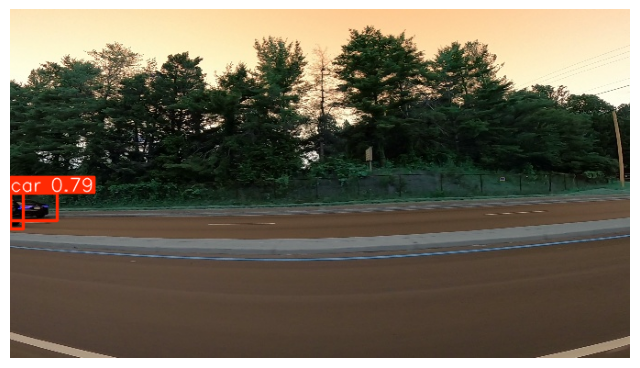


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_10140.jpg: 384x640 1 car, 12.0ms
Speed: 1.7ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


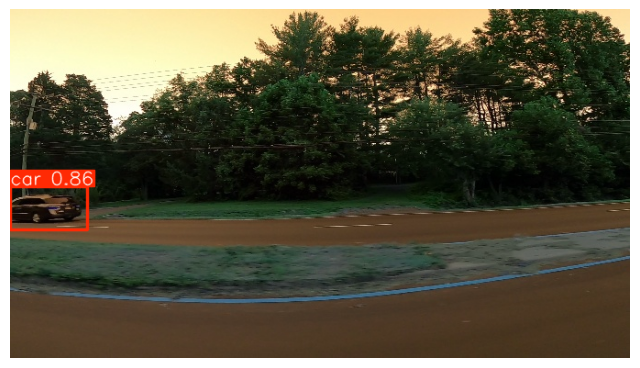


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_16020.jpg: 384x640 1 car, 15.1ms
Speed: 2.3ms preprocess, 15.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


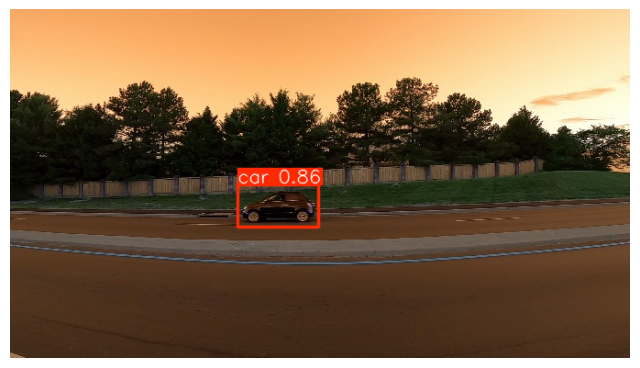


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_29900.jpg: 384x640 3 cars, 16.1ms
Speed: 2.4ms preprocess, 16.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


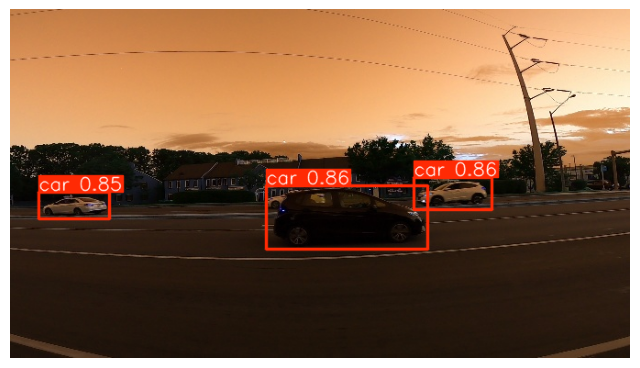


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_18860.jpg: 384x640 2 cars, 17.1ms
Speed: 1.8ms preprocess, 17.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


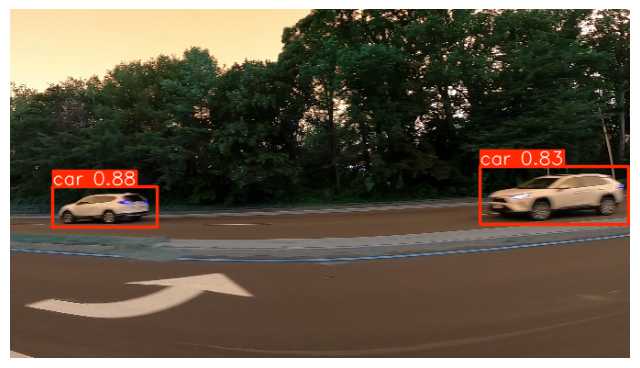


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_8680.jpg: 384x640 1 car, 19.7ms
Speed: 2.7ms preprocess, 19.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


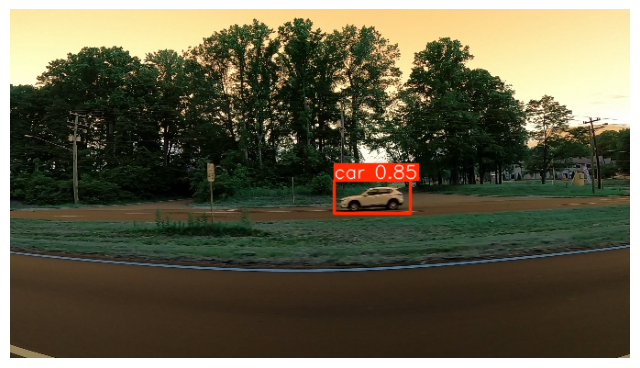


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17180.jpg: 384x640 1 car, 21.0ms
Speed: 1.8ms preprocess, 21.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


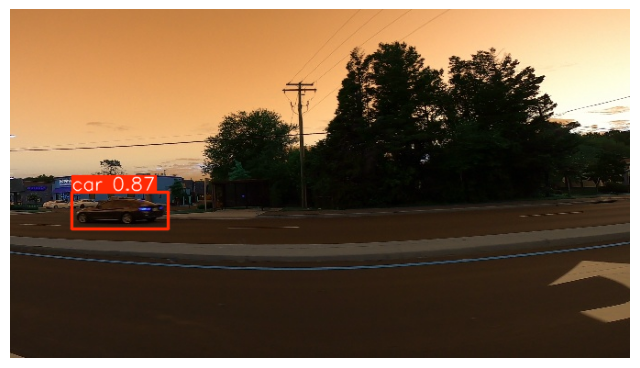


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_11380.jpg: 384x640 1 car, 21.9ms
Speed: 2.7ms preprocess, 21.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


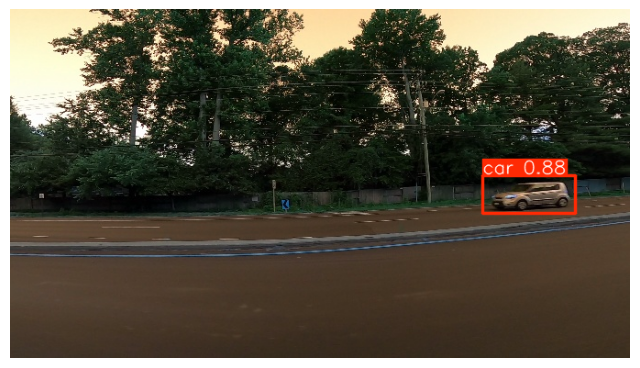


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_9440.jpg: 384x640 1 car, 23.1ms
Speed: 2.4ms preprocess, 23.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


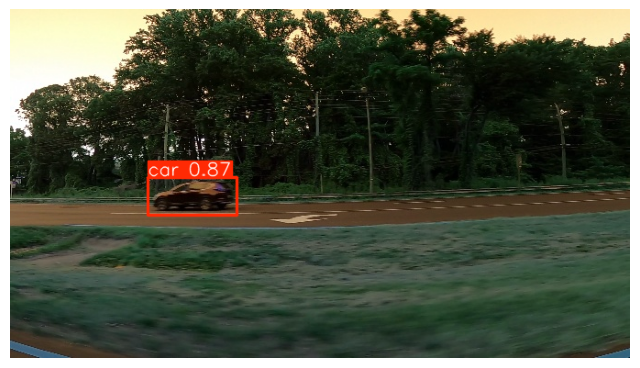


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_12040.jpg: 384x640 1 car, 24.6ms
Speed: 2.4ms preprocess, 24.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


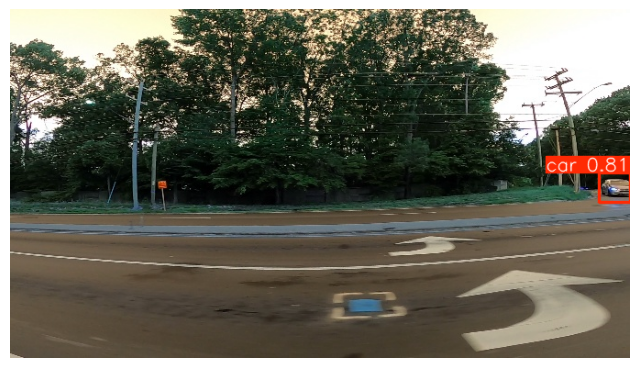


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_19080.jpg: 384x640 1 car, 25.2ms
Speed: 2.3ms preprocess, 25.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


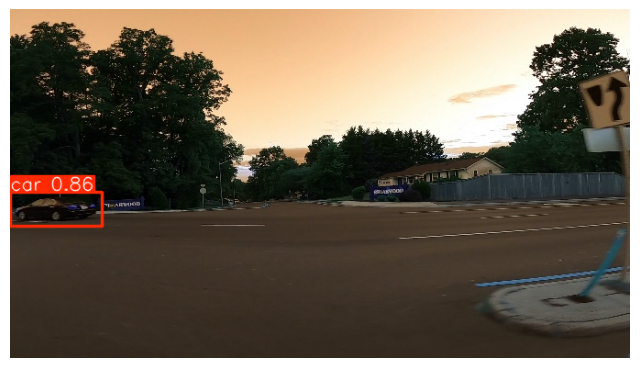


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_19880.jpg: 384x640 1 car, 25.1ms
Speed: 2.5ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


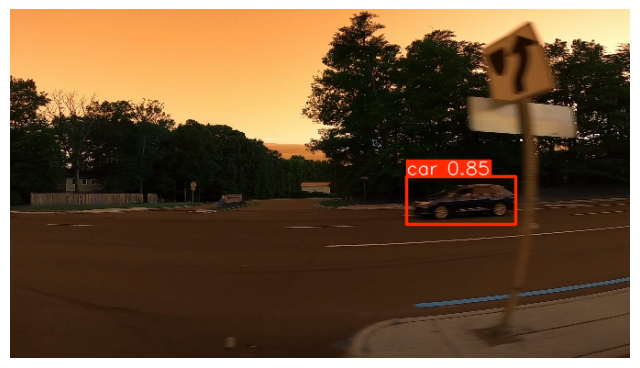


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_3540.jpg: 384x640 1 car, 25.2ms
Speed: 2.5ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


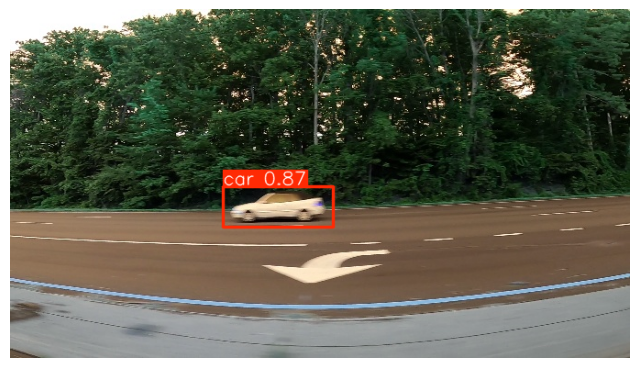


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_6360.jpg: 384x640 2 cars, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


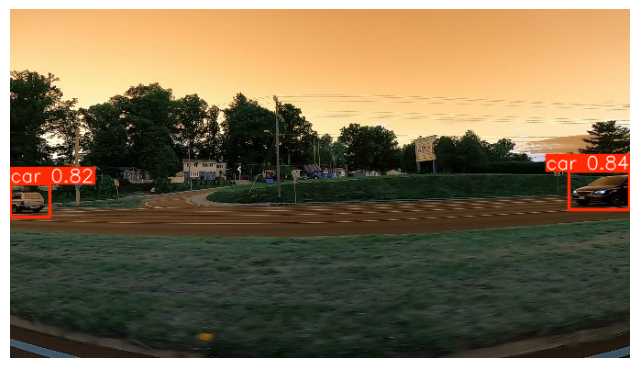


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_10120.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


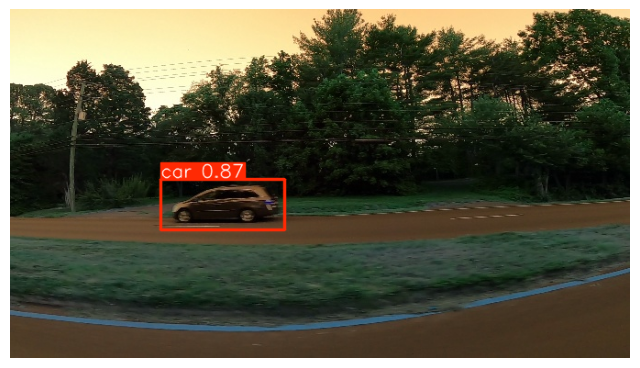


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_16720.jpg: 384x640 1 car, 25.2ms
Speed: 1.8ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


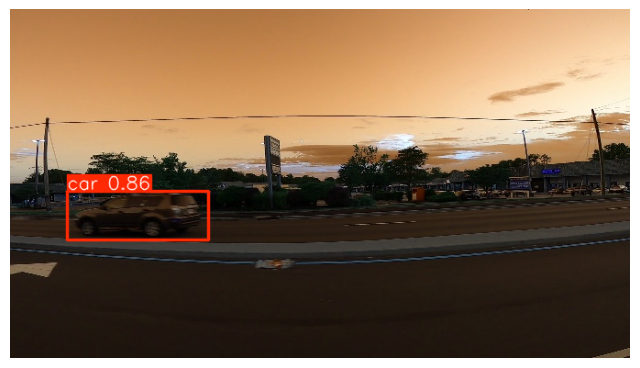


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_14160.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


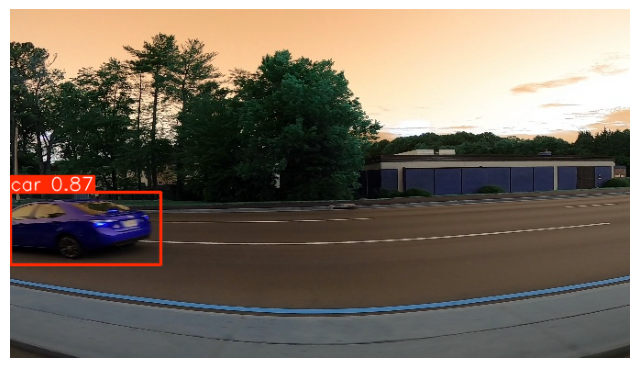


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21540.jpg: 384x640 1 car, 25.3ms
Speed: 2.6ms preprocess, 25.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


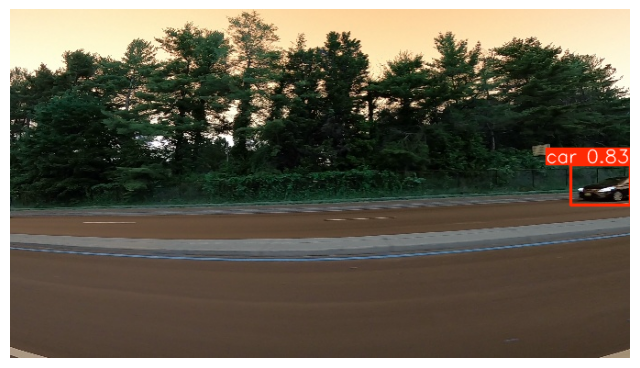


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_9780.jpg: 384x640 2 cars, 25.1ms
Speed: 1.9ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


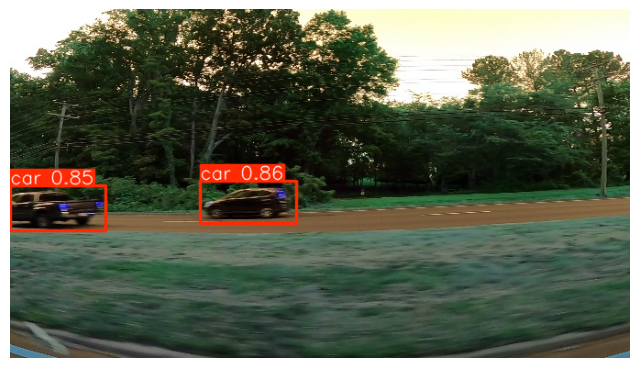


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_1860.jpg: 384x640 3 cars, 25.2ms
Speed: 1.8ms preprocess, 25.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


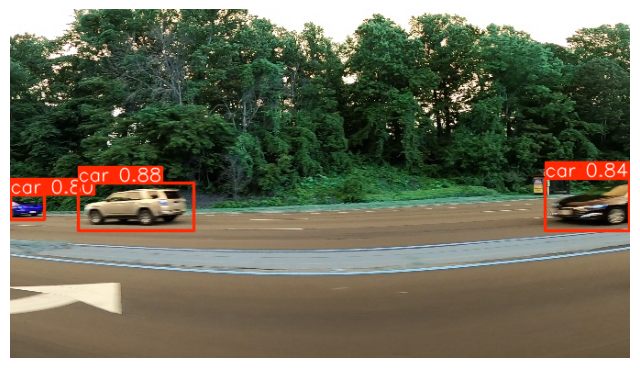


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_10040.jpg: 384x640 1 car, 25.2ms
Speed: 2.4ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


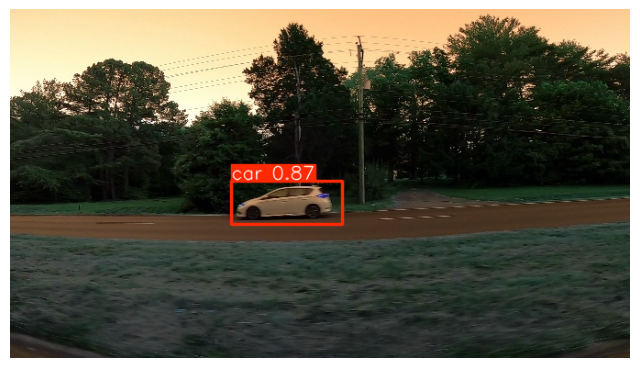


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_12380.jpg: 384x640 2 cars, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


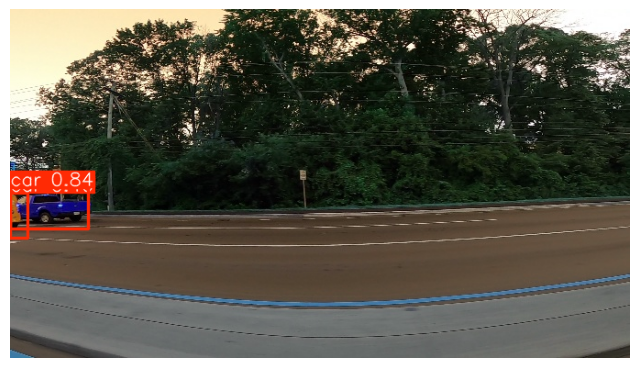


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_10020.jpg: 384x640 1 car, 25.2ms
Speed: 2.5ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


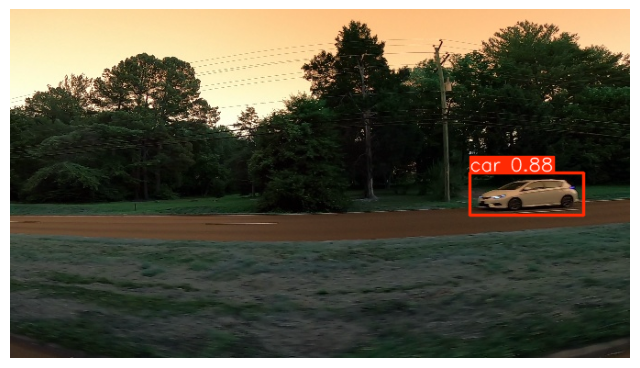


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_2180.jpg: 384x640 1 car, 25.2ms
Speed: 2.5ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


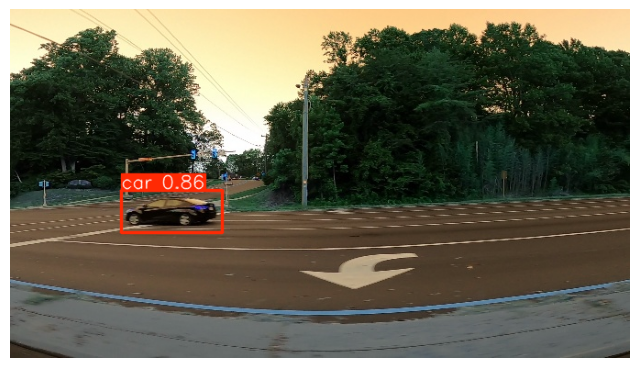


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_19920.jpg: 384x640 1 car, 25.1ms
Speed: 1.8ms preprocess, 25.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


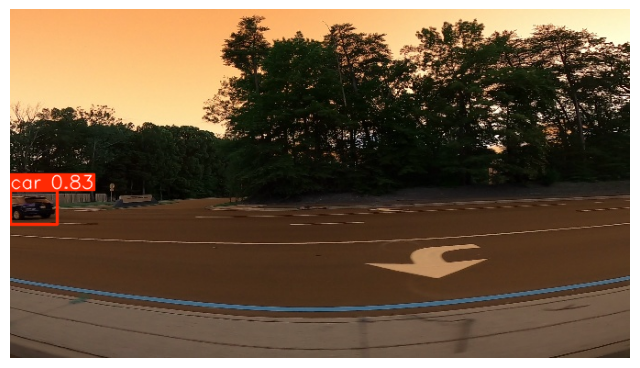


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_14440.jpg: 384x640 1 car, 25.1ms
Speed: 1.8ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


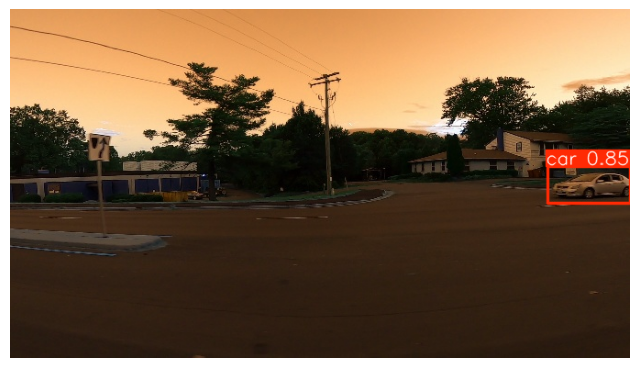


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_28440.jpg: 384x640 3 cars, 25.2ms
Speed: 1.8ms preprocess, 25.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


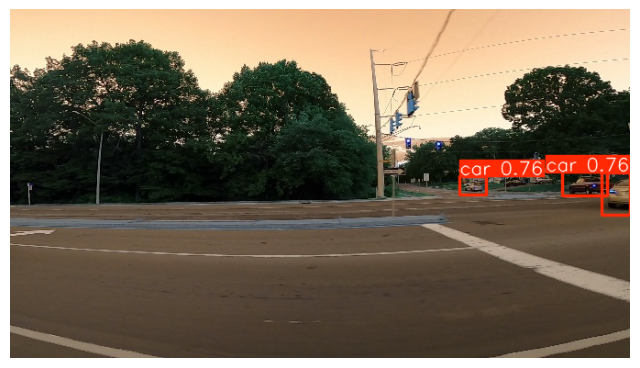


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_11420.jpg: 384x640 1 car, 25.2ms
Speed: 1.8ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


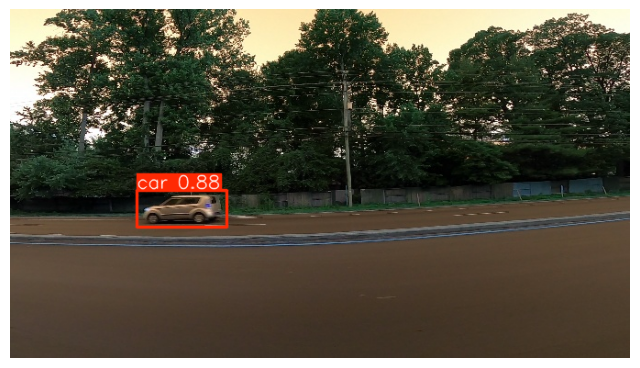


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17260.jpg: 384x640 1 car, 25.2ms
Speed: 2.6ms preprocess, 25.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


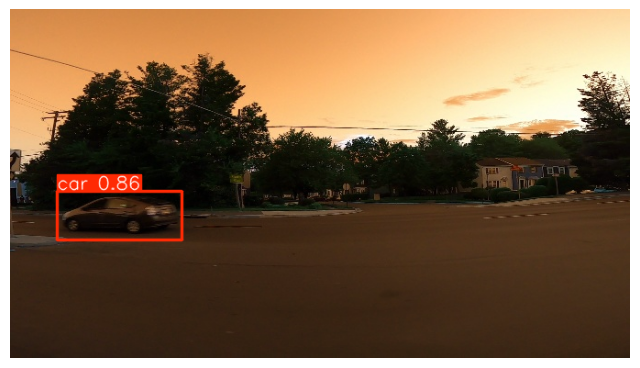


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_28200.jpg: 384x640 2 cars, 25.2ms
Speed: 2.7ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


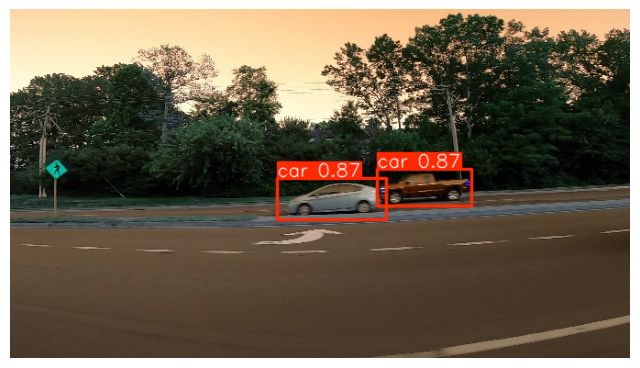


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_11440.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


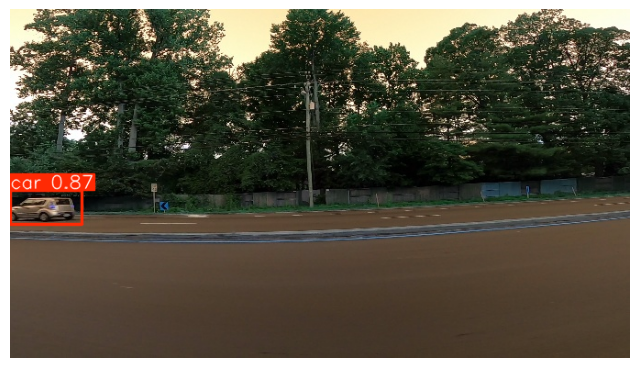


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_6200.jpg: 384x640 2 cars, 25.1ms
Speed: 1.6ms preprocess, 25.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


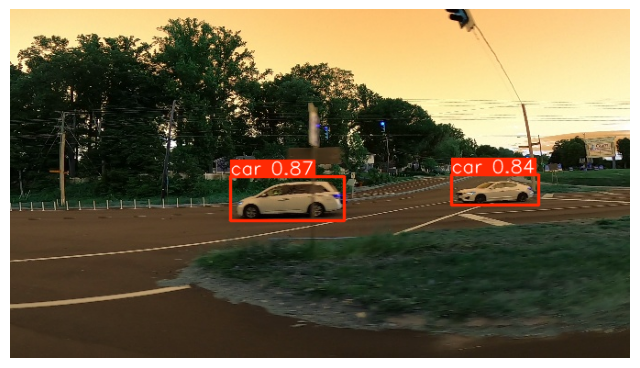


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_23000.jpg: 384x640 1 car, 25.1ms
Speed: 1.6ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


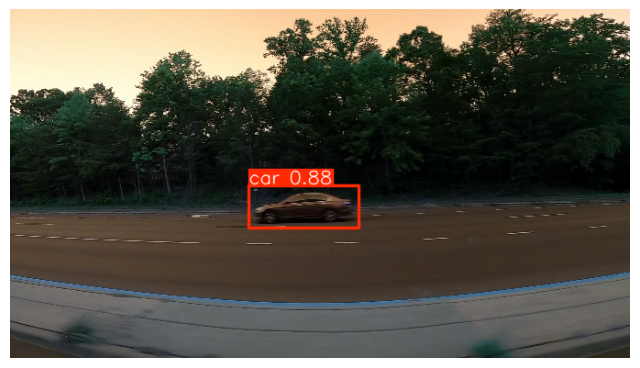


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_13580.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


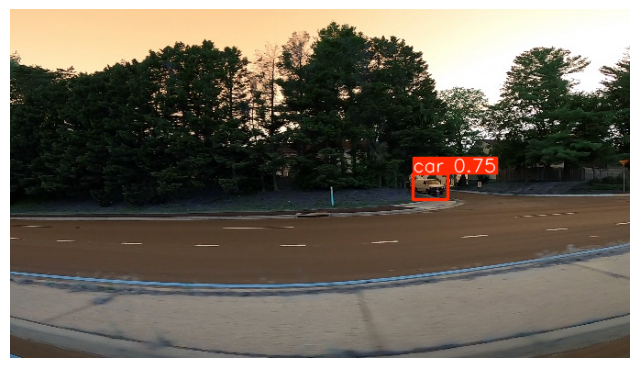


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_2200.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


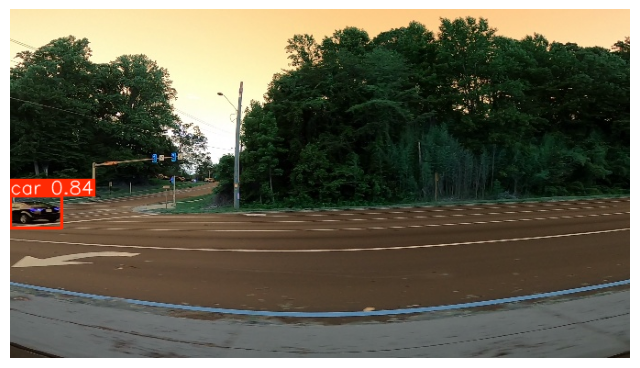


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_14460.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


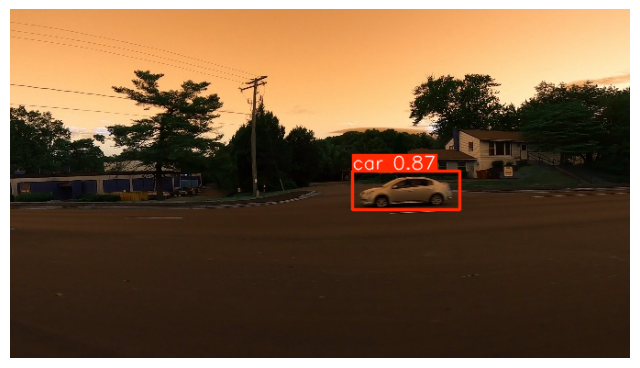


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_3260.jpg: 384x640 1 car, 25.1ms
Speed: 1.8ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


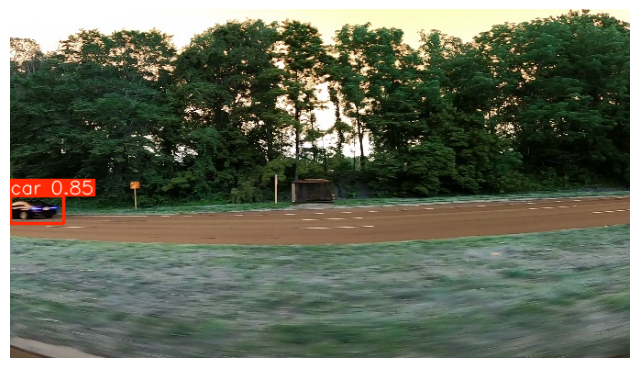


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21620.jpg: 384x640 2 cars, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


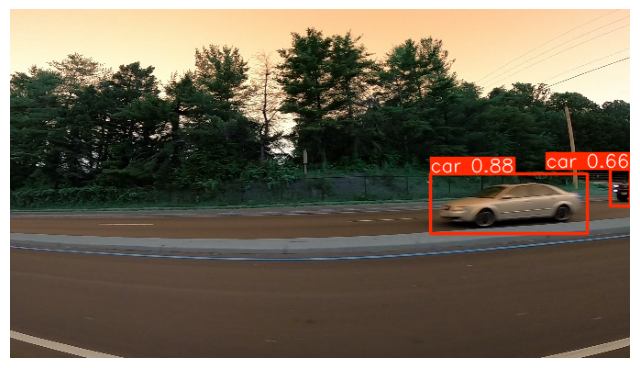


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_9600.jpg: 384x640 2 cars, 25.1ms
Speed: 2.5ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


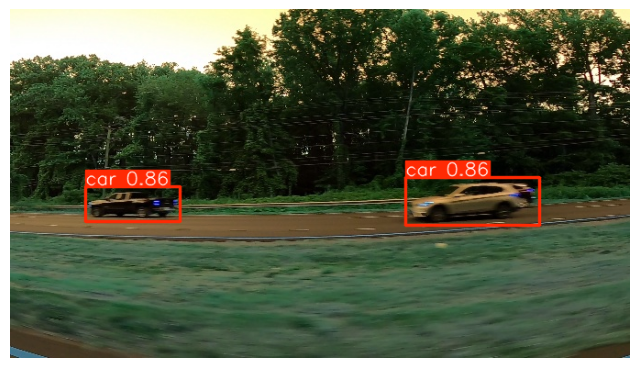


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17140.jpg: 384x640 2 cars, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


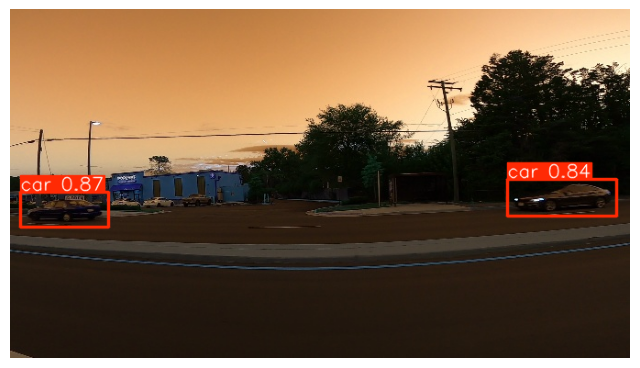

In [18]:
image_dir = "/kaggle/working/datasets/cars/images/valid"
plt.figure(figsize=(20,10))
all_images = os.listdir(image_dir)
selected_images = all_images[:40]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))
        plt.imshow(plotted_img)
        plt.axis('off')
        plt.show()


In [ ]:
model.save('Car_Detection.pt')

In [1]:
import pandas as pd
import numpy
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
from PIL import Image, ImageTk
from tkinter import filedialog, Label
import tkinter as tk
import threading

model_path = 'Car_Detection.pt'
model = YOLO(model_path)

root = tk.Tk()
root.title("Car Detection")
root.geometry("700x500")
root.configure(bg="#f0f0f5")

uploaded_image = None
image_label = None
status_label = None
file_path = None

button_style = {
    "font": ("Arial", 12, "bold"),
    "bg": "#4CAF50",  
    "fg": "white",    
    "activebackground": "#45a049",  
    "relief": tk.RAISED,
    "bd": 3
}

def upload_image():
    global uploaded_image, image_label, file_path
    file_path = filedialog.askopenfilename(filetypes=[("Image files", ".jpg;.png")])
    if file_path:
        img = Image.open(file_path)
        img = img.resize((300, 300))
        uploaded_image = ImageTk.PhotoImage(img)
        if image_label is None:
            image_label = Label(root, image=uploaded_image, bg="#f0f0f5")
            image_label.image = uploaded_image
            image_label.place(x=200, y=80)
        else:
            image_label.configure(image=uploaded_image)
            image_label.image = uploaded_image

def predict_image(image_path):
    results = model(image_path)
    result_image = results[0].plot()
    result_image_pil = Image.fromarray(result_image)
    result_image_tk = ImageTk.PhotoImage(result_image_pil)
    return result_image_tk

def handle_prediction():
    global status_label
    if uploaded_image and file_path:
        if status_label is None:
            status_label = Label(root, text="Predicting...", font=("Arial", 12), bg="#f0f0f5")
            status_label.place(x=300, y=400)
        else:
            status_label.config(text="Predicting...")
        threading.Thread(target=display_prediction_result).start()

def display_prediction_result():
    global image_label
    result_image_tk = predict_image(file_path)
    status_label.config(text="Prediction Complete")
    image_label.config(image=result_image_tk)
    image_label.image = result_image_tk

def reset_image():
    global uploaded_image, image_label, status_label, file_path
    if image_label:
        image_label.place_forget()
        image_label = None
    if status_label:
        status_label.config(text="")
    uploaded_image = None
    file_path = None
    print("Image reset.")

upload_btn = tk.Button(root, text="Upload Image", command=upload_image, **button_style)
upload_btn.place(x=50, y=100, width=120, height=40)

predict_btn = tk.Button(root, text="Predict Image", command=handle_prediction, **button_style)
predict_btn.place(x=50, y=160, width=120, height=40)

reset_btn = tk.Button(root, text="Reset", command=reset_image, **button_style)
reset_btn.place(x=50, y=220, width=120, height=40)

root.mainloop()


image 1/1 D:\RVU\Semester-5\Minors - AGV\CP3\Car Dataset\data\testing_images\vid_5_25200.jpg: 384x640 (no detections), 382.6ms
Speed: 19.0ms preprocess, 382.6ms inference, 7.0ms postprocess per image at shape (1, 3, 384, 640)
Image reset.

image 1/1 D:\RVU\Semester-5\Minors - AGV\CP3\Car Dataset\data\testing_images\vid_5_26820.jpg: 384x640 2 cars, 270.7ms
Speed: 2.0ms preprocess, 270.7ms inference, 17.3ms postprocess per image at shape (1, 3, 384, 640)
Image reset.
